## Анализ рынка заведений общественного питания г. Москвы

Цель исследования - исследовать рынок заведений общественного питания в г. Москва. Выявить интересные особенности и закономерности, сформировать рекомендации для выбора места и типа нового заведения.

Работа ведется с датасетом с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс.Карты и Яндекс.Бизнес на лето 2022 года.

 [Ссылка на презентацию](https://docs.google.com/presentation/d/1mWCGGF-LiRJhAAz8sgCuidIPXWArZ8xFz59Z9YujjYg/edit?usp=sharing)

### Загрузка и изучение данных

In [1]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px


import warnings
warnings.filterwarnings("ignore")

In [2]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('moscow_places.csv')

In [3]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
print(f"Всего ресторанов в датасете - {df['name'].count()}, из них уникальных - {df['name'].nunique()} ")


Всего ресторанов в датасете - 8406, из них уникальных - 5614 


In [6]:
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [7]:
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [8]:
df['hours'].value_counts()

ежедневно, 10:00–22:00                                                  759
ежедневно, круглосуточно                                                730
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  310
ежедневно, 12:00–00:00                                                  254
                                                                       ... 
пн-пт 17:00–03:00; сб,вс 17:00–05:00                                      1
пн,вт 09:00–21:00; ср-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00      1
пн-пт 12:00–01:00                                                         1
пн-пт 10:30–21:30; сб,вс 10:30–22:30                                      1
пн-сб 10:30–21:30                                                         1
Name: hours, Length: 1307, dtype: int64

In [9]:
df['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [10]:
df['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

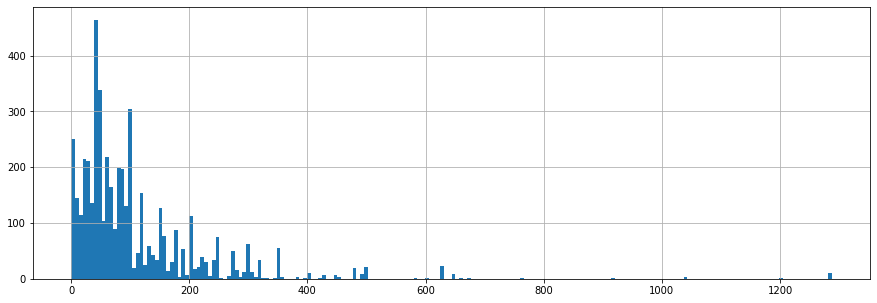

In [11]:
df['seats'].hist(bins=200, figsize=(15,5));

**Вывод:**

В представленном датасете 8406 строк и 14 столбцов, содержащие информацию о:

* name — название заведения;
* address — адрес заведения;
* category — категория заведения;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах;
* price — категория цен в заведении;
* avg_bill — строка, с примерным диапазоном цен;
* middle_avg_bill — средний чек;
* middle_coffee_cup — средняя стоимость одной чашки капучино;
* chain — сетевое заведение;
* district — административный район;
* seats — количество посадочных мест.


В представленном датасете содержится информация о 8406 заведения общественного питания, из них имеют уникальное название - 5614. Это связано с тем, что некоторые ресторанны сетевые.

Всего представлено 8 типов общественного питания:
* кафе
* ресторан
* кофейня
* бар, паб
* быстрое питания
* пиццерия
* столовая
* булочная

И 4 категории стоимости:
* высокие
* выше среднего
* средние
* низкие


### Предобработка данных

In [12]:
# Проверка данных на дубликаты
df[['name', 'address']].duplicated().sum()

0

In [13]:
# Переименуем все названия заведений на нижний регистр для поиска неявных дубликатов
df['name_2'] = df['name'].str.lower()

# Ищем дубликаты по совпадению имя-адрес
df[['name_2', 'address']].duplicated().sum()

3

In [14]:
# Удаляем неявные дубликаты
df.drop_duplicates(subset=['name_2', 'address'])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_2
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,wowфли
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,четыре комнаты
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,хазри
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,dormouse coffee shop
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,иль марко
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,суши мания
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,миславнес
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,самовар
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,чайхана sabr


In [15]:
# Кол-во прорущенных значений в столбцах
pd.DataFrame(df.isna().sum()).style.background_gradient('coolwarm')

,0
name,0
category,0
address,0
district,0
hours,536
lat,0
lng,0
rating,0
price,5091
avg_bill,4590


In [16]:
# Проверка, какие категории заведений имеют пропуски в столбце seats
df.query('seats.isnull()')['category'].value_counts()

кафе               1160
ресторан            773
кофейня             662
бар,паб             297
быстрое питание     254
пиццерия            206
столовая            151
булочная            108
Name: category, dtype: int64

В датасете содержится большое количество пропущенных значений, однако заполнить их не представляется возможным:
 * столбец hours - строковое значение, которое содержит режим работы заведения;
 * столбец price - категориальная переменная;
 * avg_bill - может сильно разниться от заведения к заведению, с учетом пропусков в столбце price нет возможности заполнить медианными значениями;
 * middle_avg_bill и middle_coffee_cup - это строковые данные, зависят от значения в avg_bill.
 * Пропуски в столбце seats могут означать, что заведение работает только на доставку и не имеет посадочных мест. Однако это выглядит странно, с некоторыми категориями, например бары, пабы. Вероятно всего данные выгружены с ошибкой.

In [17]:
# Создание столбца с названием улицы
df['street'] = df['address'].apply(lambda x: x.split(', ')[1])

# Создание столбца с True - если заведение круглосуточное:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

# Создание столбца с текстовым значением chain - для наглядности в графиках
df['chain_2'] = df['chain'].apply(lambda x: 'Сетевое' if x==1 else 'Несетевое')

In [18]:
# Создание столбца с сокращенным названием АО для удобства
districts = {
    'Центральный административный округ': 'ЦАО',
    'Северный административный округ': 'САО',
    'Южный административный округ': 'ЮАО',
    'Северо-Восточный административный округ': 'СВАО',
    'Западный административный округ': 'ЗАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Юго-Западный административный округ': 'ЮЗАО',
    'Северо-Западный административный округ': 'СЗАО'
}

df['district_short'] = df['district'].map(districts)

**Вывод:**

При выполнении предобработки данных явные дубликаты не были обнаружены. При поиске неявных дубликатов удалось обнаружить 3 строчки по совпадени имя/адрес заведения.

Некоторые столбцы датасета (hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats) содержат пропуски, однако заполнить их не представляется возможных (часть столбцов либо категориальные либо содержат строковые данные). С учетом большого числа пропущенных значений удалять такие строки нерационально. Было принято решение оставить датасет как есть.

### Анализ данных

In [19]:
# параметры визуализации
sns.set(
    font_scale =2,
    style      ='whitegrid',
    rc         ={'figure.figsize':(20,10)},
)

%config InlineBackend.figure_format = 'retina'

pd.set_option('display.float_format', '{:,.2f}'.format)

colors = sns.color_palette('muted')

#### Категории заведений

Рассмотрим заведения в разрезе по категориям.

,category,amount
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


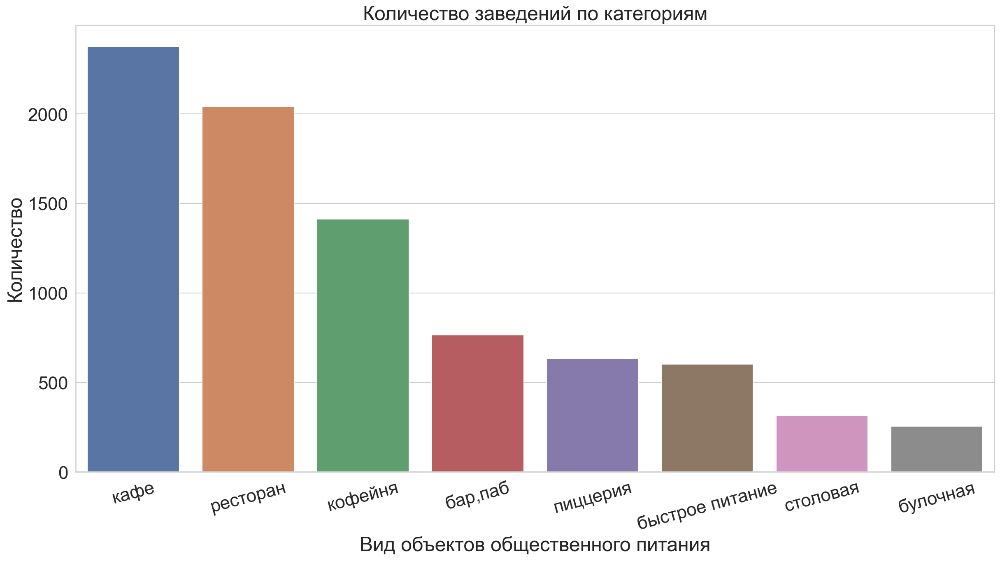

In [20]:
# Подготавливаем датасет
data = df['category'].value_counts().reset_index()
data.columns = ['category', 'amount']
display(data)

# Строим график
sns.barplot(x='category', y='amount', data=data) 

plt.ylabel('Количество')
plt.xlabel('Вид объектов общественного питания')
plt.title('Количество заведений по категориям')
plt.xticks(rotation=15);

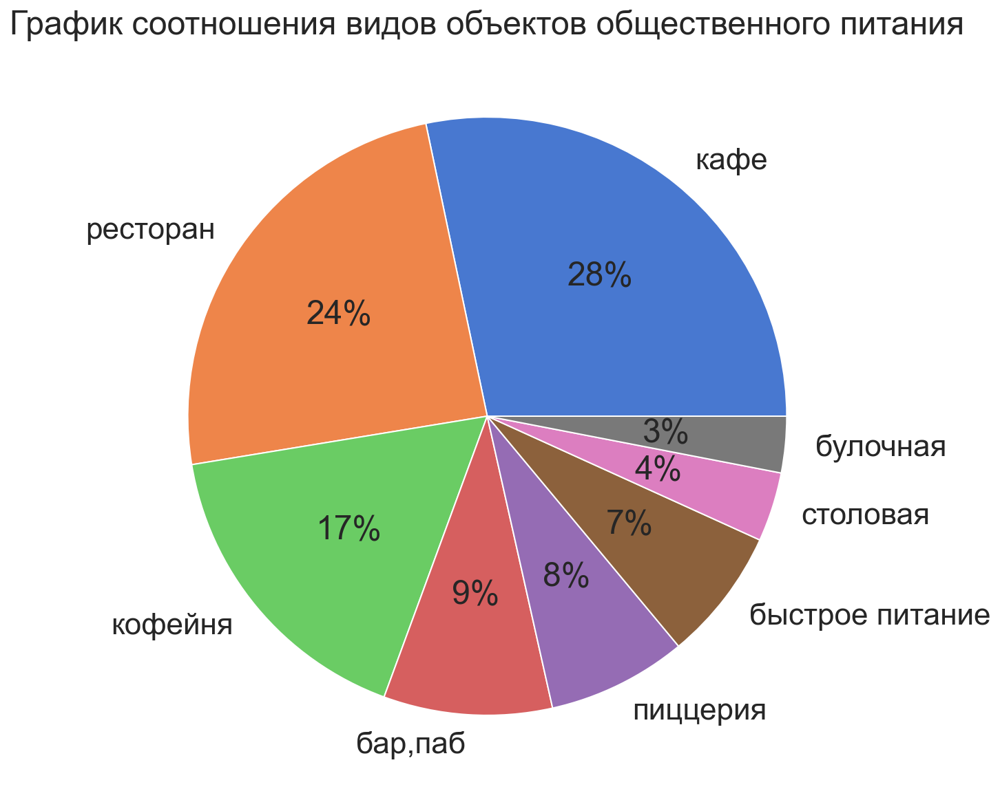

In [21]:
plt.pie(data=data, x='amount', labels='category', colors = colors, autopct='%.0f%%')

plt.title('График соотношения видов объектов общественного питания')
plt.show();

Самый популярные типы заведения - кафе и рестораны. Вместе они занимают более 50% всех заведений. Кофейни идут на третьем месте по количеству заведений.

#### Количество посадочных мест

Исследуем заведения по количеству посадочных мест.

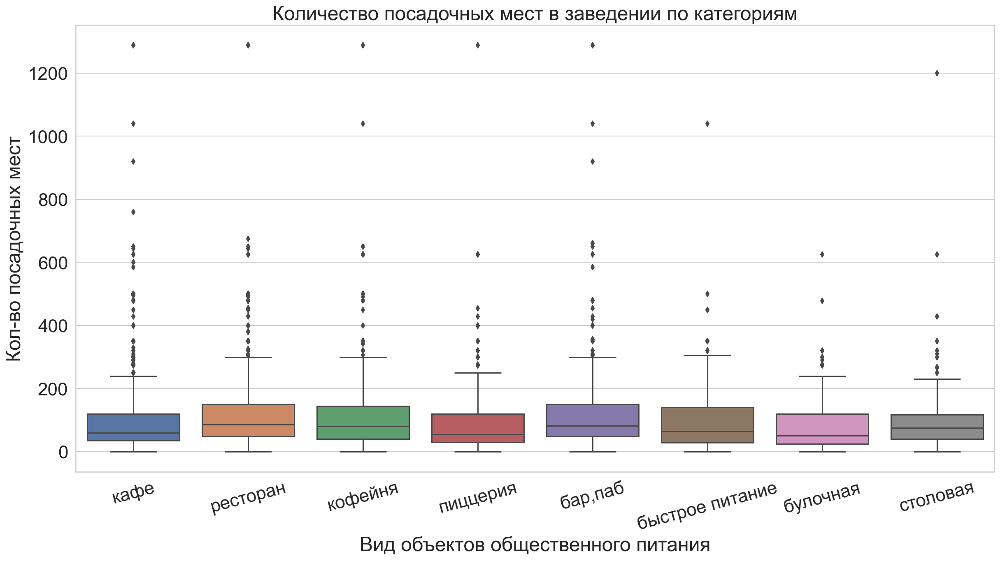

In [22]:
sns.boxplot(data=df, x='category', y='seats')

plt.ylabel('Кол-во посадочных мест')
plt.xlabel('Вид объектов общественного питания')
plt.title('Количество посадочных мест в заведении по категориям')
plt.xticks(rotation=15);

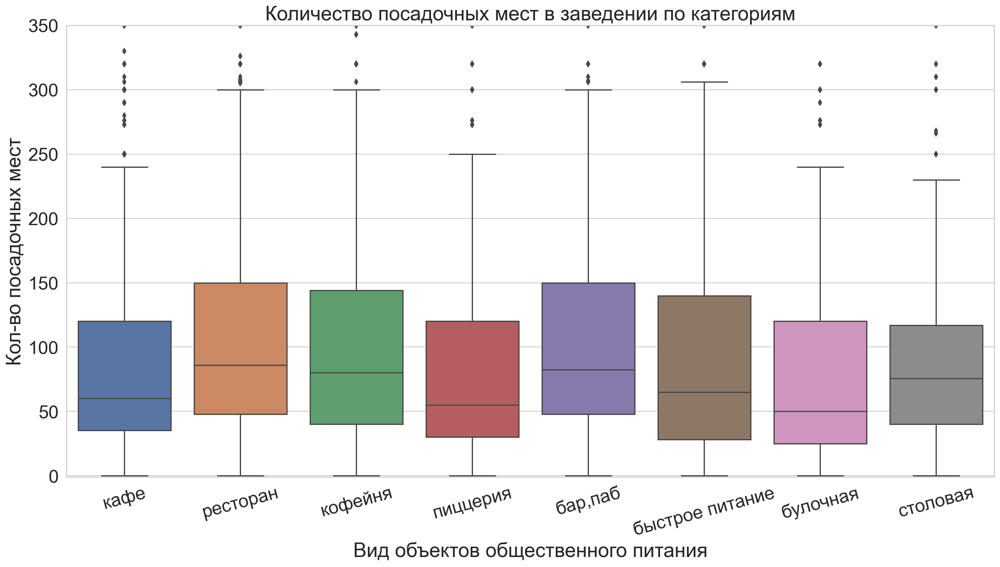

In [23]:
# Ограничим макс. кол-во посадочных мест, чтобы рассмотреть ящики
sns.boxplot(data=df, x='category', y='seats')

plt.ylabel('Кол-во посадочных мест')
plt.xlabel('Вид объектов общественного питания')
plt.title('Количество посадочных мест в заведении по категориям')
plt.xticks(rotation=15)
plt.ylim(-1, 350);

In [24]:
print('Медианное количество посадочных мест по категориям:\n', df.groupby('category').agg({'seats':'median'}))

Медианное количество посадочных мест по категориям:
                  seats
category              
бар,паб          82.50
булочная         50.00
быстрое питание  65.00
кафе             60.00
кофейня          80.00
пиццерия         55.00
ресторан         86.00
столовая         75.50


Количество посадочных мест в заведениях не слишком зависит от категории. Медианное значение вальируется от 50 (булочные) до 86 (рестораны). Немного странно, что столовые не выбиваются, ведь это тот тип заведений, который подразумевает большое количество посадочных мест. Очень подозрительно выглядят некоторые выбросы. Некоторые заведения, такие как кафе или рестораны могут иметь банкетный зал, этим можно объяснить такую высокую посадку. Но кофейня или пиццерия с количеством посадочных мест больше 1000 - выглядит очень подозрительно. Есть ощущения, что данные выгружены с ошибкой, тем более есть несколько абсолютно разных заведений разных категорий с абсолютно одинаковым количеством мест (пример ниже).

In [25]:
# Срез подозрительных строк
df[['name', 'category', 'address', 'seats']].query('seats > 1200')

,name,category,address,seats
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1","1,288.00"
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1","1,288.00"
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1","1,288.00"
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1","1,288.00"
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1","1,288.00"
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1","1,288.00"
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1","1,288.00"
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1","1,288.00"
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1","1,288.00"
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1","1,288.00"


#### Сетевые/Несетевые заведения

Выявим отношение сетевых и несетевых заведений в датасете.

In [1]:
# Подготовка данных
data = df.groupby('chain_2').agg({'name':'count'}).reset_index()

# Предварительные настройки для графиков
fg = plt.figure(figsize=(17,5), constrained_layout=True)
gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)

print('\033[1mКол-во сетевых и несетевых заведений'.center(125))

# Круговая диаграмма
fig_ax_1 = fg.add_subplot(gs[0, 0])
ax_1 = plt.pie(data=data, x='name', labels='chain_2', colors = colors, autopct='%.0f%%')

# plt.title('Отношение сетевых и несетевых заведений', fontsize=20)


# Столбчатая диаграмма
fig_ax_2 = fg.add_subplot(gs[0, 1])
ax_2 = sns.barplot(x='chain_2', y='name', data=data) 

# plt.title('Кол-во заведений', fontsize=14)
plt.xlabel('Вид заведения')
plt.ylabel('Кол-во заведений')

plt.show();

NameError: name 'df' is not defined

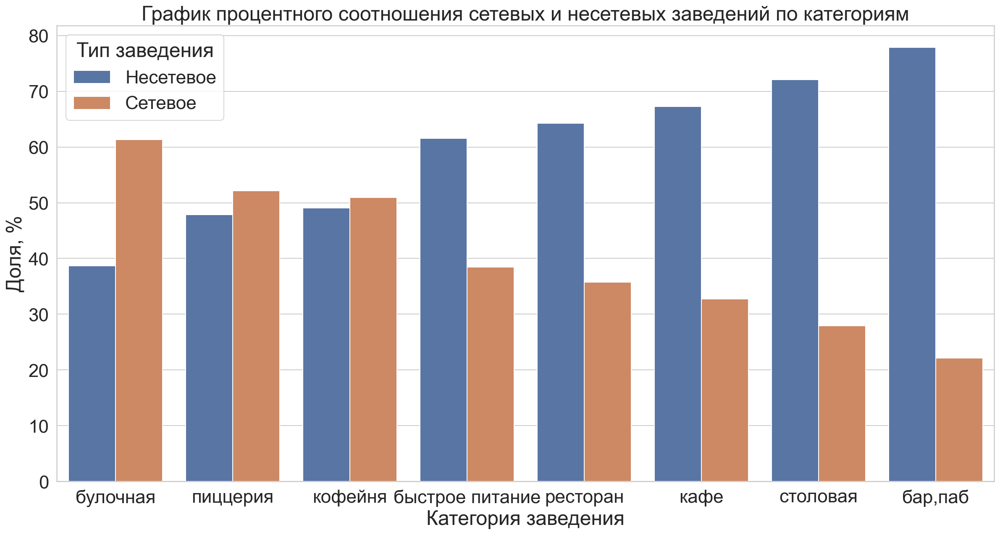

In [27]:
# Подготовка данных
data = df.pivot_table(index=['category','chain_2'], values='name', aggfunc='count').reset_index()
# Столбец с долей сетевых-несетевых заведений по каждой категории
data['percent'] = (data['name'] / data.groupby('category')['name'].transform('sum'))*100
# Сортировка
data = data.sort_values(by=['chain_2', 'percent'])

# Построение графика
sns.barplot(x='category', y='percent', data=data, hue='chain_2')

plt.title('График процентного соотношения сетевых и несетевых заведений по категориям')
plt.legend(title='Тип заведения')
plt.xlabel('Категория заведения')
plt.ylabel('Доля, %')
plt.show();

Доля сетевых заведений в датасете - 38%. Самыми популярными категориями сетевых заведений являются булочные, пиццерии и кофейни. Меньше всего сетевых заведений в категории кафе, столовые и бары,пабы.

Отпределим ТОП-15 сетей по названиям заведений в датасете.

,name,category,chain
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


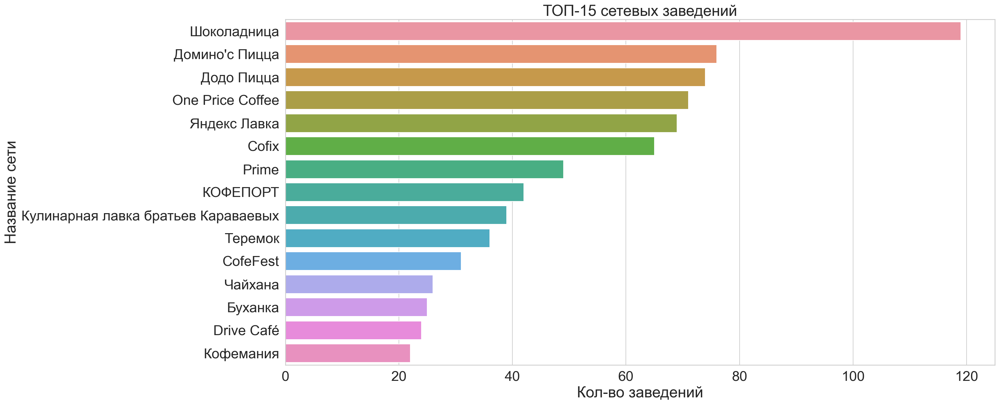

In [28]:
# Подготовка данных
data = df.query('chain == 1')\
.pivot_table(index=['name', 'category'], values='chain', aggfunc='count')\
.sort_values(by='chain', ascending=False)\
.head(15).reset_index()

display(data)

# Построение графика
sns.barplot(y='name', x='chain', data=data, orient='h')

plt.title('ТОП-15 сетевых заведений')
plt.xlabel('Кол-во заведений')
plt.ylabel('Название сети');

Среди ТОП-15 сетевых заведений 6 кофеен, 2 пиццерии, 3 ресторана, 3 кафе и 1 булочная. Больше всего точек в г. Москве имеет сеть кофеен "Шоколадница".

#### Распределение заведений по районам г. Москвы.

In [29]:
df.groupby('district', as_index=True).agg({'name':'count'}).sort_values(by='name', ascending=False)

,name
district,
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


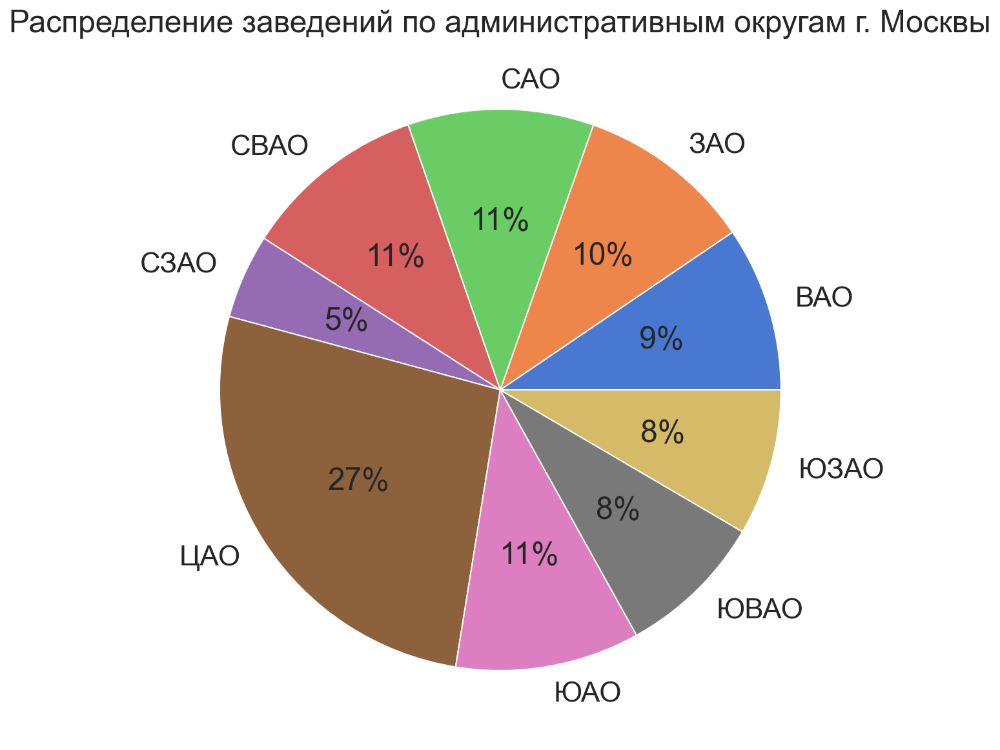

In [30]:
plt.pie(
    data=df.groupby('district_short').agg({'name': 'count'}).reset_index(), 
    x='name', 
    labels='district_short', 
    colors = colors, 
    autopct='%.0f%%'
)

plt.title('Распределение заведений по административным округам г. Москвы')
plt.show();

In [31]:
# ПЕРВЫЙ ВАРИАНТ ГРАФИКА

# Подготовка данных
# data = df.groupby(['district_short', 'category']).agg({'name':'count'})\
# .sort_values(by='name', ascending=False)\
# .reset_index()

# Построение графика
# sns.barplot(x='district_short', y='name', hue='category', data=data, palette='Set2')

# plt.title('Распределение типов заведений по административным округам')
# plt.ylabel('Кол-во заведений')
# plt.xlabel('Административный округ г. Москвы');

# ВТОРОЙ ВАРИАНТ ГРАФИКА

# Подготовка данных
# x_var = 'district_short'
# groupby_var = 'category'
# df_agg = df.loc[:, [x_var, groupby_var]].groupby(groupby_var)
# vals = [df[x_var].values.tolist() for i, df in df_agg]

# Построение графика
# plt.figure(figsize=(16,9), dpi= 80)
# plt.hist(vals, bins=df[x_var].unique().__len__(), stacked=True, density=False, color=colors[:len(vals)])

# plt.legend({group:col for group, col in zip(np.unique(df[groupby_var]).tolist(), colors[:len(vals)])})
# plt.title('Распределение категорий заведений по административным округам', fontsize=22)
# plt.xlabel('Административный округ г. Москвы')
# plt.ylabel('Кол-во заведений')
# plt.xticks(horizontalalignment='left')
# plt.show();

# ТРЕТИЙ ВАРИАНТ ГРАФИКА
# Подготовка данных
data = df.groupby(['district_short', 'category']).agg({'name':'count'})\
.reset_index()
data['total_by_district'] = data.groupby('district_short')['name'].transform('sum')
data = data.sort_values(by='total_by_district', ascending=False)

# Построение графика
fig = px.bar(data, x='district_short', y='name', color='category')

fig.update_layout(
    title='Распределение категорий заведений по административным округам',
    title_x=0.75,
    legend_title_text='Категория',
    xaxis_title='Административный округ г. Москвы',
    yaxis_title = 'Кол-во заведений'
)

#### Рейтинг заведений

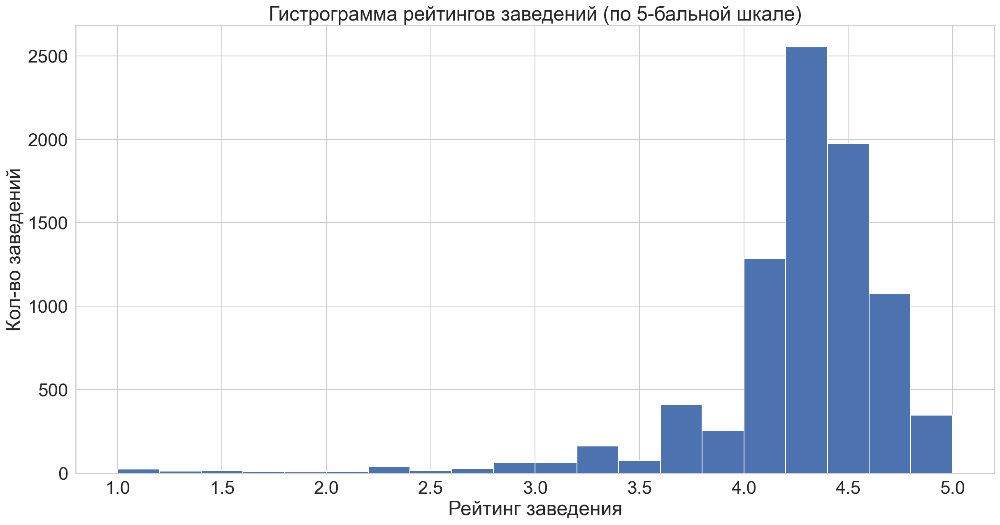

In [32]:
df['rating'].hist(bins=20)

plt.title('Гистрограмма рейтингов заведений (по 5-бальной шкале)')
plt.xlabel('Рейтинг заведения')
plt.ylabel('Кол-во заведений')
plt.show();

Проанализируем средний рейтинг заведений по категориям.

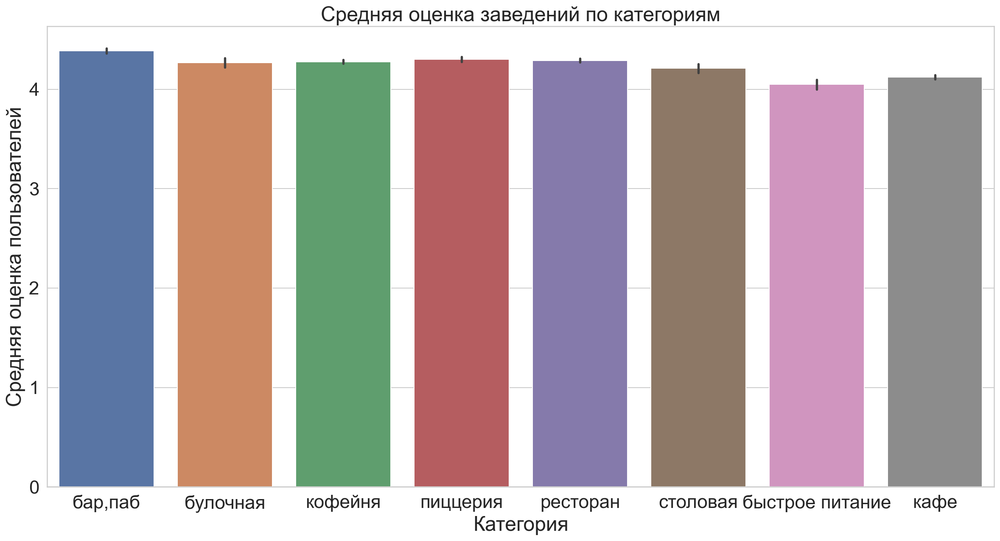

In [91]:
# Лист для сортировки
sort = df.groupby('category', as_index=False).agg({'rating':'median'})\
.sort_values(by='rating',ascending=False)['category'].tolist()

# Построение графика
sns.barplot(x='category', y='rating', data=df, order=sort)

plt.title('Средняя оценка заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Средняя оценка пользователей');

Большинство заведений имеют рейтинг выше 4.0. Средние оценки различных категорий заведений не слшком отличаются друг от друга. Самую высокую среднюю оценку имеют бары, пабы, самую низкую - заведения быстрого питания.

#### Хороплет со средним рейтингом заведений

Отобразим на карте все заведения из датасета, а также хороплет со средним рейтингом заведений по АО г.Москвы.

In [34]:
# Подготавливаем датасет
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [35]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл для хороплета и сохраняем в переменной
try:
    with open(r'admin_level_geomap.geojson', 'r', encoding='utf8') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

In [36]:
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker, LayerControl
from folium.plugins import MarkerCluster
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# добавляем возможность выключать слои
LayerControl(collapsed=True).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг заведений имеет Центральный АО. В большей части округов рейтинг примерно одинаковый - 4.15 - 4.19 из 5 возможных.

#### ТОП-15 улиц по количеству заведений

Определим улицы с самым большим количеством заведений.

In [37]:
# Выводим топ-15 улиц по количеству зведений
df['street'].value_counts().head(15)

проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: street, dtype: int64

In [57]:
# Создаем список с названием улиц, входящх в топ
top_street = df.groupby('street')['name'].count().sort_values(ascending=False).head(15).reset_index()['street'].tolist()

# Подготавливаем данные для графика
data = df[['name', 'category', 'street']].query('street in @top_street')\
.groupby(['street', 'category']).agg({'name': 'count'})\
.reset_index()
# Столбец для фильтрации
data['total_by_street'] = data.groupby('street')['name'].transform('sum')
data = data.sort_values(by='total_by_street', ascending=False)

# Строим график
fig = px.bar(data, x='street', y='name', color='category')

fig.update_layout(
    title='ТОП-15 улиц по количеству заведений с катерогиями',
    title_x=0.75,
    legend_title_text='Категория',
    xaxis_title='Название улицы',
    yaxis_title = 'Кол-во заведений'
)

Больше всего заведений расположено на проспекте Мира (184 заведения), Профсоюзной улице (122 заведения), проспекте Вернадского (108) и Ленинском проспекте (107). Эти улицы - крупнейшие радиальные в г. Москве, связывающие центр города и его окраины. Более того, под ними проходят линии метрополитена (самый популярный и загруженный транстпорт у москвичей) и множетсво станций располагается именно на данных улицах. Этим можно объяснить такое лидерство.

#### Улицы с одним объектом общепита

Найдем улицы города, на которых расположено только одно заведение общепита и нанесем их на карту.

In [39]:
# Создаем список с названиеми улиц
streets = df.groupby('street')['name'].count().reset_index().query('name == 1').reset_index()['street'].tolist()

# Создаем отфильтрованный датасет
streets_one = df.query('street in @streets')

print('Всего улиц с 1-м заведением:', streets_one['street'].nunique())

Всего улиц с 1-м заведением: 458


In [40]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
streets_one.apply(create_clusters, axis=1)

# выводим карту
m

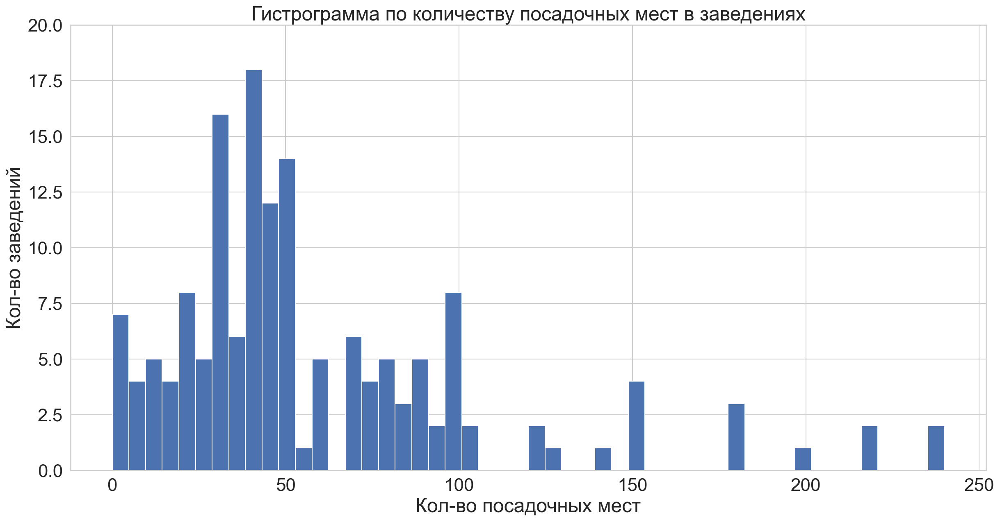

In [41]:
streets_one['seats'].hist(bins=50)

plt.title('Гистрограмма по количеству посадочных мест в заведениях')
plt.xlabel('Кол-во посадочных мест')
plt.ylabel('Кол-во заведений')
plt.ylim(0,20)
plt.show();

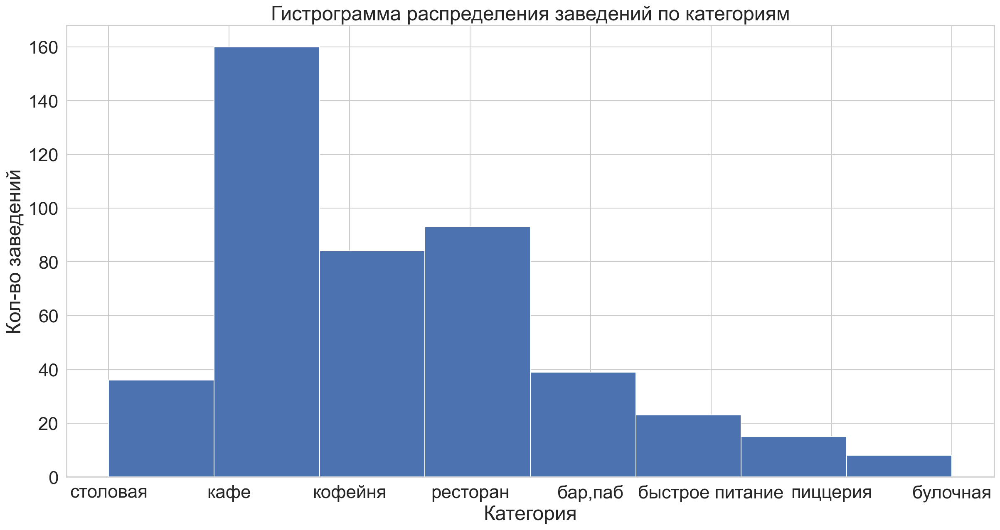

In [42]:
streets_one['category'].hist(bins=8)

plt.title('Гистрограмма распределения заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Кол-во заведений')
plt.show();

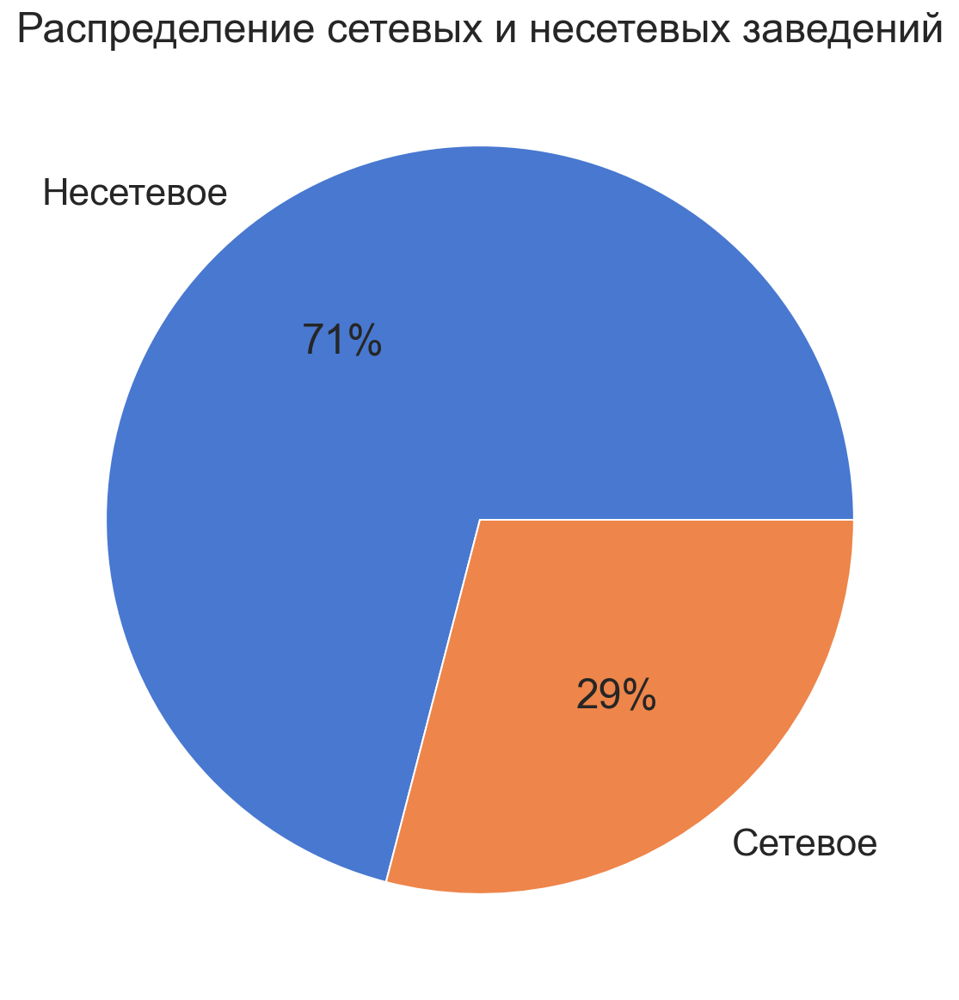

In [43]:
plt.pie(
    data=streets_one.groupby('chain_2').agg({'name': 'count'}).reset_index(), 
    x='name', 
    labels='chain_2', 
    colors = colors, 
    autopct='%.0f%%'
)

plt.title('Распределение сетевых и несетевых заведений')
plt.show();

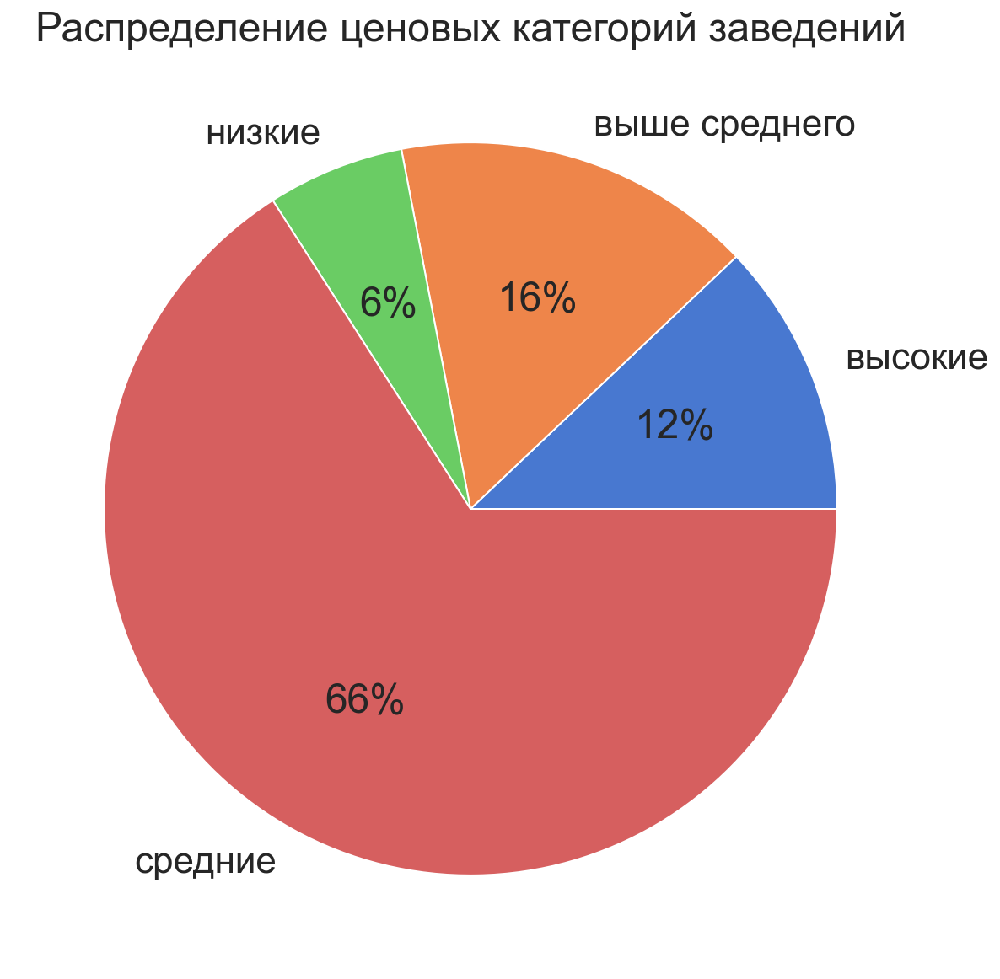

In [44]:
plt.pie(
    data=streets_one.groupby('price').agg({'name': 'count'}).reset_index(), 
    x='name', 
    labels='price', 
    colors = colors, 
    autopct='%.0f%%'
)

plt.title('Распределение ценовых категорий заведений')
plt.show();

Улиц с одним заведением 458 штук. Предварительно они ничем не отличаются от общего датасета. Большая их часть расположена в Центральном АО. В топе все те же катерогии: кафе, рестораны, кофейни со среднем посадкой до 50 мест. 71% заведений не относятся к сетевым. 66% относятся к средней ценовой категории.

#### Средний чек заведений

Определим средний чек заведений по аднимистративных округам и нанесем эти значения на карту.

In [45]:
# Подготовка данных
data = df.groupby('district', as_index=False).agg({'middle_avg_bill': 'median'})

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний чек у заведений в центральном и западном АО. В этом нет ничего удивительного: в Центральном АО расположены основные достопримечательности города, его больше всего посещают туристы. Западный АО исторически считается самым элитным для жизни, в нем множество зеленых зон и учебных заведений (МГУ, РАГС и др.).

#### Вывод по анализу датасета

Анализируя предоставленный датасет, были сделаны следующие выводы:

Самые популярные категории заведений в г. Москве это – кафе (28% от общего числа заведений), рестораны (24%) и кофейни (17%). 

Сетевых заведений около 38% от общего числа. Самые популярные сетевые категории - это булочные, пиццерии и кофейни. Самая крупная сеть общепита – кофейни Шоколадница (119 точек в Москве). Всего в ТОП-15 сетевых заведений вошли 6 кофеен, 2 пиццерии, 3 ресторана, 3 кафе и 1 булочная.

Медианное число посадочных мест в заведениях – 50-86.

Больше всего заведений расположены в Центральном АО (27% от общего числа, 2242 заведения). Самая популярная категория в нем – рестораны. Меньше всего заведений в Северно-Западном АО (5%, 409 заведений). В остальных АО количество заведений распределено приблизительно одинаково.

Большинство заведений общепита имеют рейтинг выше 4,0 (по 5-бальной шкале). Самую высокую среднюю оценку имеют бары, пабы, самую низкую - заведения быстрого питания. Если рассматривать средний рейтинг заведений по административным округам, самый высокий средним рейтингом у заведений в Центральном АО.

Больше всего заведений расположено на проспекте Мира (184 заведения), Профсоюзной улице (122 заведения), проспекте Вернадского (108) и Ленинском проспекте (107). Эти улицы - крупнейшие радиальные в г. Москве, связывающие центр города и его окраины.

Самый высокий средний чек у заведений в Центральном и Западном АО – около 1000 руб.


### Открытие кофейни

#### Анализ кофеен 

In [79]:
# Готовим датасет, в котором отфильтруем только кофейни
coffe_only = df.query('category == "кофейня"')

coffee_total = coffe_only['name'].count()
coffee_24_total = coffe_only['is_24/7'].sum()

print(
    f"Всего кофеен в датасете: {coffee_total}, Из них круглосуточных: {coffee_24_total}\
 ({coffee_24_total/coffee_total:.0%} от общего числа)"
)

Всего кофеен в датасете: 1413, Из них круглосуточных: 59 (4% от общего числа)


                                              Кол-во сетевых и несетевых кофеен                                              


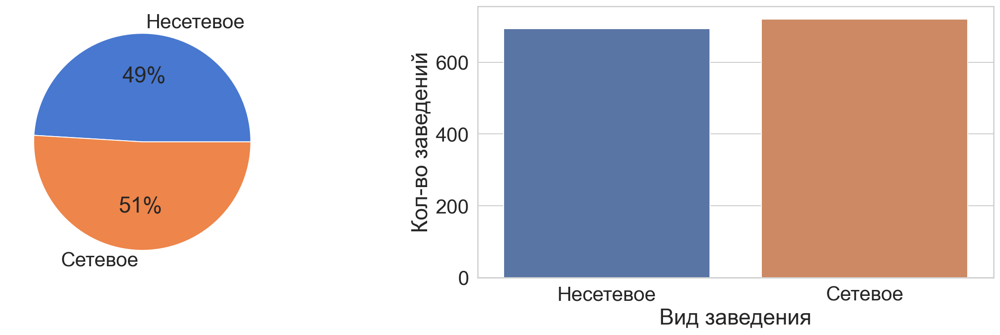

In [47]:
# Подготовка данных для графика
data = coffe_only.groupby('chain_2').agg({'name':'count'}).reset_index()


# Предварительные настройки для графиков
fg = plt.figure(figsize=(17,5), constrained_layout=True)
gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)


print('Кол-во сетевых и несетевых кофеен'.center(125))

# Круговая диаграмма
fig_ax_1 = fg.add_subplot(gs[0, 0])
ax_1 = plt.pie(data=data, x='name', labels='chain_2', colors = colors, autopct='%.0f%%')

# plt.title('Отношение сетевых и несетевых заведений', fontsize=20)


# Столбчатая диаграмма
fig_ax_2 = fg.add_subplot(gs[0, 1])
ax_2 = sns.barplot(x='chain_2', y='name', data=data) 

# plt.title('Кол-во заведений', fontsize=14)
plt.xlabel('Вид заведения')
plt.ylabel('Кол-во заведений')

plt.show();

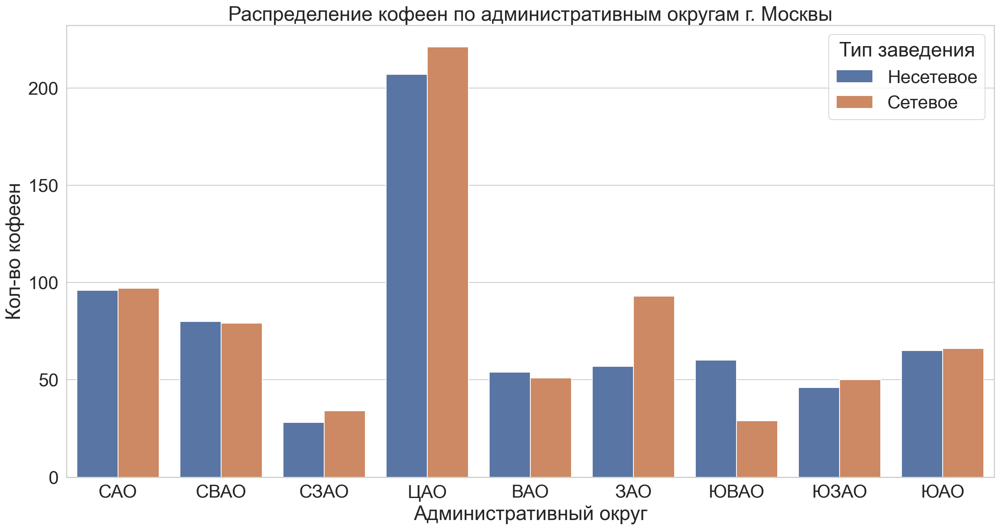

In [48]:
sns.countplot(x='district_short', data=coffe_only, hue='chain_2')

plt.title('Распределение кофеен по административным округам г. Москвы')
plt.legend(title='Тип заведения')
plt.xlabel('Административный округ')
plt.ylabel('Кол-во кофеен');

Больше чем половину рынка занимают сетевые кофейни. При этом распределение по АО более-менее равномерное.

Определим ТОП-10 сетевых кофеен по количеству заведений и посмотрим их распределение по административным округам

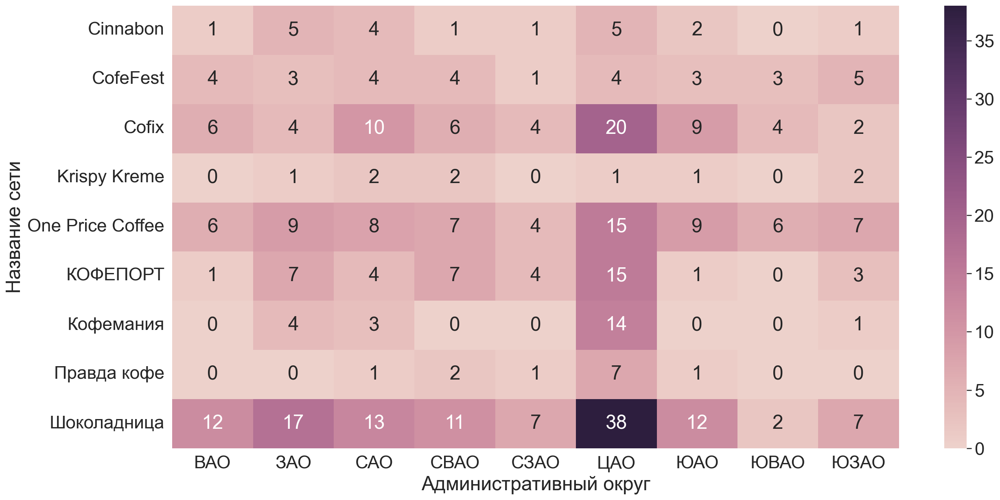

In [49]:
# Лист с ТОП-10 сетевых кофеен по кол-ву точек
top_coffe = coffe_only['name'].value_counts().head(10).reset_index()['index'].tolist()

# Подготовка данных для графика
data = coffe_only.query('chain == 1 & name in @top_coffe').pivot_table(index='name', columns='district_short', values='district', aggfunc='count')
data = data.fillna(0)

# Построение тепловой карты
ax = sns.heatmap(data, annot=True, cmap=sns.cubehelix_palette(as_cmap=True))

ax.set(xlabel="Административный округ", ylabel="Название сети");

Практически каждая большая сеть имеет хотя бы одно заведение в каждом административном округе. Самыми непривлекательными рафонами для сетей являются Юго-восточный и Северо-западный округа - в них сетевых кофеен меньше всего.

Рассмотрим рейтинги кофеен.

In [50]:
data = coffe_only.groupby('district', as_index=False)['rating'].agg('mean')

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffe_only.apply(create_clusters, axis=1)

# добавляем возможность выключать слои
LayerControl(collapsed=True).add_to(m)

# выводим карту
m

Рассмотрим средний чек кофеен в зависимости от района.

In [51]:
data = coffe_only.groupby('district', as_index=False).agg({'name': 'count', 'middle_coffee_cup': ['count','median']})
data.columns = ['district', 'place_number', 'has_avg_bill', 'median_coffee_bill']
data

,district,place_number,has_avg_bill,median_coffee_bill
0,Восточный административный округ,105,42,135.00
1,Западный административный округ,150,49,189.00
2,Северный административный округ,193,76,159.00
3,Северо-Восточный административный округ,159,60,162.50
4,Северо-Западный административный округ,62,21,165.00
5,Центральный административный округ,428,162,190.00
6,Юго-Восточный административный округ,89,34,147.50
7,Юго-Западный административный округ,96,34,198.00
8,Южный административный округ,131,43,150.00


Средний чек вальируется от 135 до 198 рублей. Однако при стоит учесть, что большая часть кофеен имеет пропуски и данные могут быть непоказательны.

Рассмотрим распределение круглосуточных кофеен по районам.

In [52]:
data = coffe_only[coffe_only['is_24/7'] == 1].groupby('district').agg({'name':'count', 'chain':'sum'})
data.columns = ['27/7_total', 'including_chain']

data

,27/7_total,including_chain
district,,
Восточный административный округ,5,5
Западный административный округ,9,8
Северный административный округ,5,5
Северо-Восточный административный округ,3,3
Северо-Западный административный округ,2,2
Центральный административный округ,26,20
Юго-Восточный административный округ,1,1
Юго-Западный административный округ,7,5
Южный административный округ,1,1


Большая часть круглосуточных кофеен расположены в Центральном АО. Также стоит обратить внимание, что большая часть таких заведений относится к сетевым.

#### Рекомендации по открытию кофейни в г. Москве



Для открытия популярной кофейни рекомендуемый районы - Западный или Центральный административные округа. 

Западный АО наиболее интересен, потому что в нем расположено много объектов, обеспечивающих постоянный поток посетителей (МГУ, большое количество парковых зон). Более того, жилье в ЗАО считается элитным и одним из самых высоких по стоимости. В нем расположено намного меньше кофеен, чем в Центральном АО, а рейтинг кофеен не слишком высок. Кроме того, этот АО имеет один из самых высоких средних чеков в заведениях общепита.

Вторым по привлекательности районов кажется Центральный АО. Однако в нем конкуренция намного выше, в том числе много сетевых кофеен, большинство людей (а особенно туристов) старается ходить в заведение, которое на слуху.

При открытии кофейни конечно стоит учитывать стоимость аренды и прочие факторы, однако ориентировочная стоимость чашки капучино лучше установить от 160 до 190 рублей (слишком низкая стоимость будут вызывать подозрения в качестве продукта у посетителей, слишком высокая - отпугнет посетителей).

Как показывается анализ кофейни расположены по городу достаточно равномерно, а половину рынка занимают сетевые заведения. Поэтому помимо расположения следует разработать концепцию, по которой заведение будет привлекать посетителей. Вот несколько идей:

* Рассмотреть вариант круглосуточной кофейни. В Москве круглосуточных кофеен всего 59 из 1413 заведений (около 4%). Большая часть из них расположены именно в Центральном округе. Можно проанализировать самые популярные места города с ночной активностью в качестве места расположения.
* Обычно формат кофейни подразумевает отсутствие полноценного меню и официатнов. Это позволяет сэкономить на кухне и персонале. Однако стоит рассмотреть варианты закусок в заведении. Можно договориться с местными бизнесами и установить витрины с десертами и/или сэндвичами.
* Не всегда людям удобно заходить в заведение (собака, ролики, велосипед, мешок картошки). Для таких посетилелей удобно установить окно для заказа напитка непосредственно с улицы.
* При выбора места расположении кофейни в жилом районе или рядом с учебными заведениями стоит учитывать, что чаще всего кофейни - заведение для одиночек (а еще фрилансеров, которые просто могут занимать столик часами). Это может быть рассмотрено как с положительной, так и с отрицательной стороны. Но методы оформления помещения и способы удержания посетителей - тема уже для отдельного исследования.